In [4]:
import os
import requests
import pandas as pd

# Define base URL
url = "https://earthquake.usgs.gov/fdsnws/event/1/query"

# Parameters template
params = {
    "format": "geojson",
    "minmagnitude": 5.0,
    "orderby": "time",
}

# Directory to save the file
output_dir = "C:/Users/subha/Desktop/Earthquake"
os.makedirs(output_dir, exist_ok=True)  # Ensure the directory exists

# Function to fetch data for a specific time range
def fetch_data(starttime, endtime):
    params["starttime"] = starttime
    params["endtime"] = endtime
    response = requests.get(url, params=params)
    if response.status_code == 200:
        return response.json()
    else:
        print(f"Failed to fetch data for {starttime} to {endtime}: {response.status_code}")
        print("Response message:", response.text)
        return None

# Iterate over years
all_earthquakes = []
for year in range(2020, 2025):
    starttime = f"{year}-01-01"
    endtime = f"{year}-12-31"
    print(f"Fetching data for {starttime} to {endtime}...")
    data = fetch_data(starttime, endtime)
    if data:
        for feature in data["features"]:
            properties = feature["properties"]
            geometry = feature["geometry"]["coordinates"]
            all_earthquakes.append({
                "time": properties["time"],
                "latitude": geometry[1],
                "longitude": geometry[0],
                "depth": geometry[2],
                "magnitude": properties["mag"],
                "place": properties["place"],
            })

# Convert to DataFrame
df = pd.DataFrame(all_earthquakes)

# Save to CSV
output_file = os.path.join(output_dir, "earthquake_data_2020_2024.csv")
df.to_csv(output_file, index=False)
print(f"Earthquake data saved to '{output_file}'")


Fetching data for 2020-01-01 to 2020-12-31...
Fetching data for 2021-01-01 to 2021-12-31...
Fetching data for 2022-01-01 to 2022-12-31...
Fetching data for 2023-01-01 to 2023-12-31...
Fetching data for 2024-01-01 to 2024-12-31...
Earthquake data saved to 'C:/Users/subha/Desktop/Earthquake/earthquake_data_2020_2024.csv'


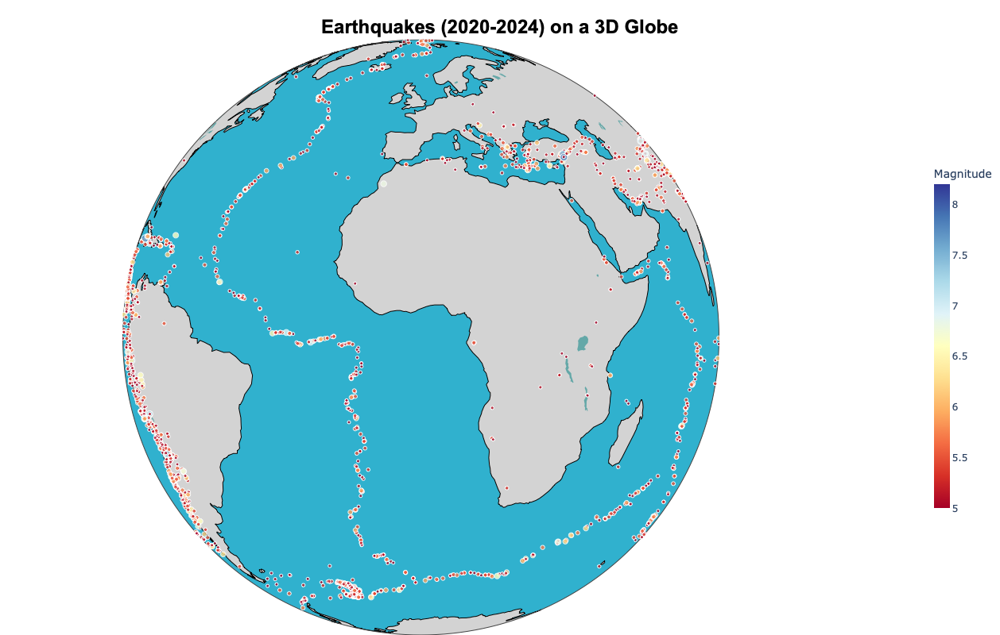

In [5]:
import pandas as pd
import plotly.graph_objects as go

# Load earthquake data
df = pd.read_csv("earthquake_data_2020_2024.csv")

# Normalize marker size based on magnitude (with a dynamic range)
min_size = 4  # Minimum marker size
max_size = 10  # Maximum marker size
df["marker_size"] = ((df["magnitude"] - df["magnitude"].min()) / 
                     (df["magnitude"].max() - df["magnitude"].min()) * 
                     (max_size - min_size) + min_size)

# Create a 3D scatter plot on a globe
fig = go.Figure()

# Add earthquake data
fig.add_trace(
    go.Scattergeo(
        lon=df["longitude"],
        lat=df["latitude"],
        text=df["place"] + "<br>Magnitude: " + df["magnitude"].astype(str) + 
             "<br>Depth: " + df["depth"].astype(str) + " km",  # Add depth to hover text
        mode="markers",
        marker=dict(
            size=df["marker_size"],  # Use the normalized marker size for magnitude
            color=df["magnitude"],  # Use depth as the color scale
            colorscale="RdYlBu",  # Perceptually uniform colorscale for depth
            cmin=df["magnitude"].min(),  # Minimum depth for color scaling
            cmax=df["magnitude"].max(),  # Maximum depth for color scaling
            colorbar=dict(
                title="Magnitude",  # Add a title to the colorbar
                len=0.6,  # Adjust the length of the colorbar (as a fraction of the plot height)
                thickness=20,  # Set the thickness of the colorbar in pixels
                x=1.1,  # Position the colorbar slightly outside the plot (horizontally)
                tickfont=dict(size=12),  # Set font size for tick labels
            ),
            opacity=0.8,  # Set marker transparency
        ),
    )
)

# Customize globe appearance
fig.update_geos(
    projection_type="orthographic",  # Globe-like projection
    showcoastlines=True,
    coastlinecolor="black",
    showland=True,
    landcolor="lightgray",
    showocean=True,
    oceancolor="#30b1ce",
    showlakes=True,
    lakecolor="#64a8a8",
    showcountries=False,
    countrycolor="blue",
)

# Set layout and title
fig.update_layout(
    title={
        "text": "Earthquakes (2020-2024) on a 3D Globe",  # Title text
        "x": 0.5,  # Center the title horizontally
        "xanchor": "center",  # Set the title's anchor to the center
        "yanchor": "top",  # Align the title vertically to the top
        "font": {
            "family": "Arial",  # Set font family
            "size": 24,  # Set font size
            "color": "black",  # Set font color
            "weight": "bold",  # Make the title bold
        }
    },
    height=800,  # Set plot height
    margin={"r": 0, "t": 50, "l": 0, "b": 0},  # Adjust margins
)

# Show the plot
fig.show()

In [6]:
# Save the plot as an HTML file
output_path = "earthquake_Globe_2020_2024.html"
fig.write_html(output_path)

Fetching data for 2020-01-01 to 2020-12-31...
Fetching data for 2021-01-01 to 2021-12-31...
Fetching data for 2022-01-01 to 2022-12-31...
Fetching data for 2023-01-01 to 2023-12-31...
Fetching data for 2024-01-01 to 2024-12-31...
Earthquake data saved to 'earthquake_data_2020_2024.csv'


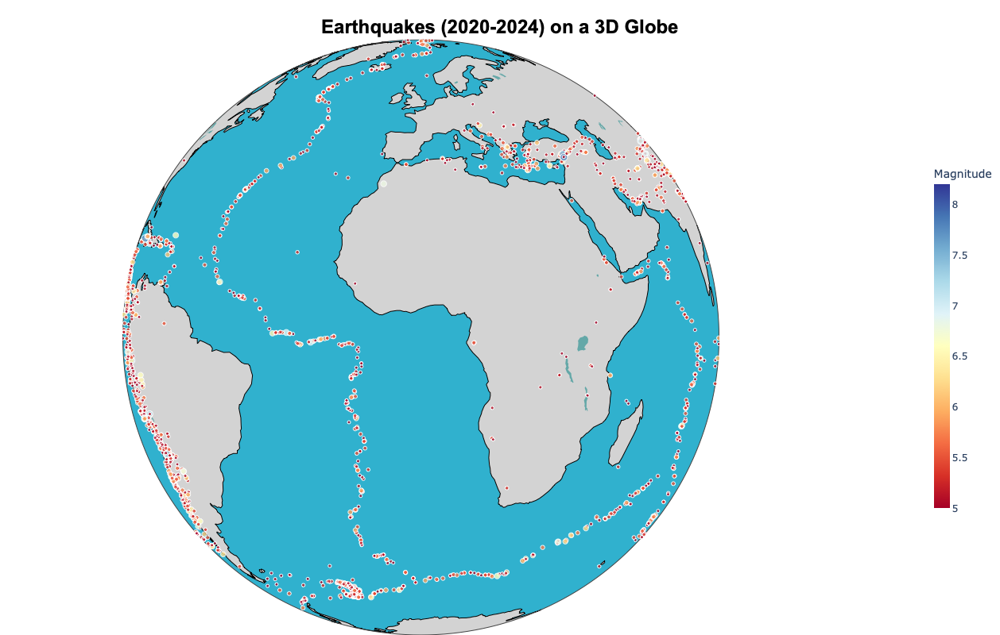

In [ ]:
# Import necessary libraries
import requests
import pandas as pd
import plotly.graph_objects as go
import os
import imageio.v2 as imageio  # Updated import to suppress the warning

# Define base URL for the USGS earthquake data API
url = "https://earthquake.usgs.gov/fdsnws/event/1/query"

# Parameters template for the API request
params = {
    "format": "geojson",
    "minmagnitude": 5.0,
    "orderby": "time",
}

# Function to fetch data for a specific time range
def fetch_data(starttime, endtime):
    params["starttime"] = starttime
    params["endtime"] = endtime
    response = requests.get(url, params=params)
    if response.status_code == 200:
        return response.json()
    else:
        print(f"Failed to fetch data for {starttime} to {endtime}: {response.status_code}")
        print("Response message:", response.text)
        return None

# Fetch earthquake data for the years 2020 to 2024
all_earthquakes = []
for year in range(2020, 2025):
    starttime = f"{year}-01-01"
    endtime = f"{year}-12-31"
    print(f"Fetching data for {starttime} to {endtime}...")
    data = fetch_data(starttime, endtime)
    if data:
        for feature in data["features"]:
            properties = feature["properties"]
            geometry = feature["geometry"]["coordinates"]
            all_earthquakes.append({
                "time": properties["time"],
                "latitude": geometry[1],
                "longitude": geometry[0],
                "depth": geometry[2],
                "magnitude": properties["mag"],
                "place": properties["place"],
            })

# Convert the collected data to a DataFrame
df = pd.DataFrame(all_earthquakes)

# Save the DataFrame to a CSV file
df.to_csv("earthquake_data_2020_2024.csv", index=False)
print("Earthquake data saved to 'earthquake_data_2020_2024.csv'")

# Load the saved earthquake data for visualization
df = pd.read_csv("earthquake_data_2020_2024.csv")

# Normalize marker size based on magnitude
min_size = 4
max_size = 10
df["marker_size"] = ((df["magnitude"] - df["magnitude"].min()) /
                     (df["magnitude"].max() - df["magnitude"].min()) *
                     (max_size - min_size) + min_size)

# Create a 3D scatter plot on a globe
fig = go.Figure()

# Add earthquake data to the plot
fig.add_trace(
    go.Scattergeo(
        lon=df["longitude"],
        lat=df["latitude"],
        text=df["place"] + "<br>Magnitude: " + df["magnitude"].astype(str) + 
             "<br>Depth: " + df["depth"].astype(str) + " km",
        mode="markers",
        marker=dict(
            size=df["marker_size"],
            color=df["magnitude"],
            colorscale="RdYlBu",
            cmin=df["magnitude"].min(),
            cmax=df["magnitude"].max(),
            colorbar=dict(
                title="Magnitude",
                len=0.6,
                thickness=20,
                x=1.1,
                tickfont=dict(size=12),
            ),
            opacity=0.8,
        ),
    )
)

# Customize globe appearance
fig.update_geos(
    projection_type="orthographic",
    showcoastlines=True,
    coastlinecolor="black",
    showland=True,
    landcolor="lightgray",
    showocean=True,
    oceancolor="#30b1ce",
    showlakes=True,
    lakecolor="#64a8a8",
    showcountries=False,
)

# Set layout and title for the plot
fig.update_layout(
    title={
        "text": "Earthquakes (2020-2024) on a 3D Globe",
        "x": 0.5,
        "xanchor": "center",
        "yanchor": "top",
        "font": {
            "family": "Arial",
            "size": 24,
            "color": "black",
            "weight": "bold",
        }
    },
    height=800,
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
)

# Show the plot
fig.show()

# Save the plot as an HTML file
output_path = "earthquake_Globe_2020_2024.html"
fig.write_html(output_path)

# Directory to save frames for animation
frames_dir = "Earthquake/frames"
os.makedirs(frames_dir, exist_ok=True)

# Calculate frame details for a 30-second video
fps = 30
total_frames = fps * 30
rotation_step = 360 / total_frames
frame_paths = []

# Generate frames for the animation
for frame_idx in range(total_frames):
    angle = frame_idx * rotation_step
    fig.update_geos(projection_rotation=dict(lon=angle))
    frame_path = os.path.join(frames_dir, f"frame_{frame_idx:03d}.png")
    fig.write_image(frame_path, width=1600, height=1600)
    frame_paths.append(frame_path)

# Create an animation video
output_video = "Earthquake_Globe_Animation.mp4"
with imageio.get_writer(output_video, fps=fps) as writer:
    for frame_path in frame_paths:
        image = imageio.imread(frame_path)
        writer.append_data(image)

print(f"30-second animation saved at {output_video}")


In [1]:
import os
import imageio.v2 as imageio  # Updated import
import plotly.graph_objects as go
import pandas as pd

# Load the earthquake data
df = pd.read_csv("earthquake_data_2020_2024.csv")

# Normalize marker size based on magnitude
min_size = 4
max_size = 10
df["marker_size"] = ((df["magnitude"] - df["magnitude"].min()) /
                     (df["magnitude"].max() - df["magnitude"].min()) *
                     (max_size - min_size) + min_size)

# Create a Plotly figure
fig = go.Figure()

# Add earthquake data
fig.add_trace(
    go.Scattergeo(
        lon=df["longitude"],
        lat=df["latitude"],
        text=df["place"] + "<br>Magnitude: " + df["magnitude"].astype(str),
        mode="markers",
        marker=dict(
            size=df["marker_size"],
            color=df["magnitude"],
            colorscale="RdYlBu",
            cmin=df["magnitude"].min(),
            cmax=df["magnitude"].max(),
            colorbar=dict(title="Magnitude"),
            opacity=1,
        ),
    )
)

# Customize the globe appearance
fig.update_geos(
    projection_type="orthographic",
    showcoastlines=True,
    coastlinecolor="black",
    showland=True,
    landcolor="lightgray",
    showocean=True,
    oceancolor="#30b1ce",
    showlakes=True,
    lakecolor="#64a8a8",
    showcountries=False,
)

# Directory to save frames
frames_dir = "Earthquake/frames"
os.makedirs(frames_dir, exist_ok=True)

# Set frame details
fps = 30
total_frames = fps * 30
rotation_step = 360 / total_frames
frame_paths = []

# Generate frames for animation
for frame_idx in range(total_frames):
    angle = frame_idx * rotation_step
    fig.update_geos(projection_rotation=dict(lon=angle))
    frame_path = os.path.join(frames_dir, f"frame_{frame_idx:03d}.png")
    fig.write_image(frame_path, width=1600, height=1600)
    frame_paths.append(frame_path)
    print(f"Saved frame {frame_idx + 1}/{total_frames} to {frame_path}")

# Verify if all frames are generated
if len(frame_paths) != total_frames:
    print(f"Expected {total_frames} frames but found {len(frame_paths)}. Check frame generation.")

# Create MP4 animation using imageio
output_video = "Earthquake_Globe_Animation.mp4"
try:
    with imageio.get_writer(output_video, fps=fps) as writer:
        for frame_path in frame_paths:
            image = imageio.imread(frame_path)
            writer.append_data(image)
    print(f"30-second animation saved at {output_video}")
except Exception as e:
    print(f"Error during MP4 creation: {e}")


Saved frame 1/900 to Earthquake/frames/frame_000.png
Saved frame 2/900 to Earthquake/frames/frame_001.png
Saved frame 3/900 to Earthquake/frames/frame_002.png
Saved frame 4/900 to Earthquake/frames/frame_003.png
Saved frame 5/900 to Earthquake/frames/frame_004.png
Saved frame 6/900 to Earthquake/frames/frame_005.png
Saved frame 7/900 to Earthquake/frames/frame_006.png
Saved frame 8/900 to Earthquake/frames/frame_007.png
Saved frame 9/900 to Earthquake/frames/frame_008.png
Saved frame 10/900 to Earthquake/frames/frame_009.png
Saved frame 11/900 to Earthquake/frames/frame_010.png
Saved frame 12/900 to Earthquake/frames/frame_011.png
Saved frame 13/900 to Earthquake/frames/frame_012.png
Saved frame 14/900 to Earthquake/frames/frame_013.png
Saved frame 15/900 to Earthquake/frames/frame_014.png
Saved frame 16/900 to Earthquake/frames/frame_015.png
Saved frame 17/900 to Earthquake/frames/frame_016.png
Saved frame 18/900 to Earthquake/frames/frame_017.png
Saved frame 19/900 to Earthquake/fram

In [2]:
import os
import subprocess

# Construct the full path to the MP4 file
file_path = os.path.expanduser("~/Desktop/SphereStats/Earthquake_Globe_Animation.mp4")

# Open the file using the default system application
if os.name == 'nt':  # For Windows
    os.startfile(file_path)
elif os.name == 'posix':  # For Linux/Mac
    subprocess.call(['open', file_path])  # On Mac
    # For Linux, use 'xdg-open' instead of 'open'
    # subprocess.call(['xdg-open', file_path])
else:
    print("Unsupported OS")

print(f"Opening: {file_path}")


Opening: /Users/ghulamabbaszafari/Desktop/SphereStats/Earthquake_Globe_Animation.mp4


In [1]:
import os
import pandas as pd
import plotly.graph_objects as go
import imageio.v2 as imageio

# Load earthquake data
df = pd.read_csv("earthquake_data_2020_2024.csv")

# Normalize marker size based on magnitude
min_size = 4
max_size = 30  # Increase max size for better visibility
df["marker_size"] = ((df["magnitude"] - df["magnitude"].min()) /
                     (df["magnitude"].max() - df["magnitude"].min()) *
                     (max_size - min_size) + min_size)

# Directory to save frames
frames_dir = "Earthquake/frames"
os.makedirs(frames_dir, exist_ok=True)

# Calculate frame details for a 30-second video
fps = 30  # Frames per second
total_frames = fps * 30  # Total frames for a 30-second video
rotation_step = 360 / total_frames  # Rotation step size per frame
frame_paths = []

# Generate frames for the animation
for frame_idx in range(total_frames):
    angle = frame_idx * rotation_step  # Current rotation angle
    
    # Create figure
    fig = go.Figure()
    
    # Add earthquake data with bars
    fig.add_trace(
        go.Scattergeo(
            lon=df["longitude"],
            lat=df["latitude"],
            text=df["place"] + "<br>Magnitude: " + df["magnitude"].astype(str),
            mode="markers",
            marker=dict(
                size=df["marker_size"],
                color=df["magnitude"],
                colorscale="Viridis",
                cmin=df["magnitude"].min(),
                cmax=df["magnitude"].max(),
                colorbar=dict(title="Magnitude"),
                opacity=0.8,
            ),
        )
    )
    
    # Customize globe appearance
    fig.update_geos(
        projection_type="orthographic",
        showcoastlines=True,
        coastlinecolor="black",
        showland=True,
        landcolor="lightgray",
        showocean=True,
        oceancolor="#30b1ce",
        showlakes=True,
        lakecolor="#64a8a8",
        showcountries=False,
    )
    
    # Rotate the globe
    fig.update_geos(projection_rotation=dict(lon=angle))
    
    # Layout settings with centered title
    fig.update_layout(
        title=dict(
            text="Earthquakes (2020-2024) on a 3D Rotating Globe",
            x=0.5,
            xanchor='center',
            yanchor='top',
            font=dict(size=24)
        ),
        height=800,
        width=800,
        margin={"r": 0, "t": 50, "l": 0, "b": 0},
    )
    
    # Save the frame
    frame_path = os.path.join(frames_dir, f"frame_{frame_idx:03d}.png")
    fig.write_image(frame_path, width=800, height=800)
    frame_paths.append(frame_path)

# Create an animation video
output_video = "Earthquake_Globe_Animation.mp4"
with imageio.get_writer(output_video, fps=fps) as writer:
    for frame_path in frame_paths:
        image = imageio.imread(frame_path)
        writer.append_data(image)

print(f"30-second animation saved at {output_video}")


30-second animation saved at Earthquake_Globe_Animation.mp4


In [1]:
import os
import subprocess

# Construct the full path to the MP4 file
file_path = os.path.expanduser("Earthquake_Globe_Animation.mp4")

# Open the file using the default system application
if os.name == 'nt':  # For Windows
    os.startfile(file_path)
elif os.name == 'posix':  # For Linux/Mac
    subprocess.call(['open', file_path])  # On Mac
    # For Linux, use 'xdg-open' instead of 'open'
    # subprocess.call(['xdg-open', file_path])
else:
    print("Unsupported OS")

print(f"Opening: {file_path}")


Opening: Earthquake_Globe_Animation.mp4
